encoder,decoder不一样

In [1]:
import os 
import sys
os.chdir(os.path.abspath(os.path.join(os.getcwd(), '..', '../..')))
print(os.getcwd())
import torch

import json
from types import SimpleNamespace

from Model.vit import  PretrainModel


/mnt/nas/home/huxing/202407/ctf/SolarCLIP_tq


加载模型

In [3]:
pretrain_json_path = '/mnt/nas/home/huxing/202407/ctf/SolarCLIP_tq/checkpoints/pretrain/endecoder_distinct/modal_magnet_0094/enhance_log1p_1/preprocess_1024_0.5_90/weights_typecv-rdbu_3sgm-continous/args.json'

with open(pretrain_json_path, 'r') as f:
    pretrain_args = json.load(f)
    pretrain_args = SimpleNamespace(**pretrain_args)
for arg in vars(pretrain_args):
    print(arg, getattr(pretrain_args, arg))

checkpoint_path_mag = '/mnt/nas/home/huxing/202407/ctf/SolarCLIP_tq/checkpoints/pretrain/endecoder_distinct/modal_magnet_0094/enhance_log1p_1/preprocess_1024_0.5_90/weights_typecv-rdbu_3sgm-continous/magnet'
logger_checkpoint_path_mag = checkpoint_path_mag + '/logger/'
model_checkpoint_path_mag = checkpoint_path_mag + '/model/'
load_dir_mag = model_checkpoint_path_mag + 'epoch_100.pt'

checkpoint_path_0094 = '/mnt/nas/home/huxing/202407/ctf/SolarCLIP_tq/checkpoints/pretrain/endecoder_distinct/modal_magnet_0094/enhance_log1p_1/preprocess_1024_0.5_90/weights_typecv-rdbu_3sgm-continous/0094'
logger_checkpoint_path_0094 = checkpoint_path_0094 + '/logger/'
model_checkpoint_path_0094 = checkpoint_path_0094 + '/model/'
load_dir_0094 = model_checkpoint_path_0094 + 'epoch_100.pt'
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')


pretrainModel_mag = PretrainModel(input_size=pretrain_args.input_size, embedding_dim=pretrain_args.embedding_dim, input_dim=pretrain_args.input_dim, patch_size=pretrain_args.patch_size, dropout_prob=pretrain_args.dropout_prob, output_dim=pretrain_args.output_dim, output_size=pretrain_args.output_size, deprojection_type=pretrain_args.deprojection_type, with_bias=pretrain_args.with_bias)
pretrainModel_mag.load_state_dict(torch.load(load_dir_mag)['model'])   
pretrainModel_mag.to(device)

pretrainModel_0094 = PretrainModel(input_size=pretrain_args.input_size, embedding_dim=pretrain_args.embedding_dim, input_dim=pretrain_args.input_dim, patch_size=pretrain_args.patch_size, dropout_prob=pretrain_args.dropout_prob, output_dim=pretrain_args.output_dim, output_size=pretrain_args.output_size, deprojection_type=pretrain_args.deprojection_type, with_bias=pretrain_args.with_bias)
pretrainModel_0094.load_state_dict(torch.load(load_dir_0094)['model'])
pretrainModel_0094.to(device)

config_path configs/pretrain/args0.json
batch_size 32
optimizer AdamW
lr 0.0004
epochs 100
test_freq 10
save_freq 10
device cuda:3
input_size 1024
embedding_dim 768
input_dim 1
patch_size 64
dropout_prob 0.1
output_dim 1
output_size 1024
deprojection_type linear
with_bias True
modal_list ['magnet', '0094']
enhance_list ['log1p', 1]
image_preprocess [1024, 0.5, 90]
weights_type_list ['cv-rdbu', '3sgm-continous']
checkpoint_path /mnt/nas/home/huxing/202407/ctf/SolarCLIP_tq/checkpoints/pretrain/
log_path /mnt/nas/home/huxing/202407/ctf/SolarCLIP_tq/log/pretrain/


PretrainModel(
  (encoder): Encoder(
    (conv1): Conv2d(1, 768, kernel_size=(64, 64), stride=(64, 64), bias=False)
    (ln_pre): patch_norm(
      (norm): BatchNorm1d(768, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (dropout): Dropout(p=0.1, inplace=False)
  )
  (decoder): Decoder(
    (linear): Linear(in_features=768, out_features=768, bias=True)
    (gelu): QuickGELU()
    (deprojection): Sequential(
      (0): Linear(in_features=768, out_features=1536, bias=True)
      (1): QuickGELU()
      (2): Linear(in_features=1536, out_features=3072, bias=True)
      (3): QuickGELU()
      (4): Linear(in_features=3072, out_features=4096, bias=True)
    )
  )
)

In [4]:
print((pretrainModel_mag.encoder.conv1.weight!=pretrainModel_0094.encoder.conv1.weight).sum())
print((pretrainModel_0094.decoder.decoder[0].weight!=pretrainModel_mag.decoder.decoder[0].weight).sum())

tensor(3145728, device='cuda:0')


AttributeError: 'Decoder' object has no attribute 'decoder'

训练曲线

loading  magnet
loading  0094


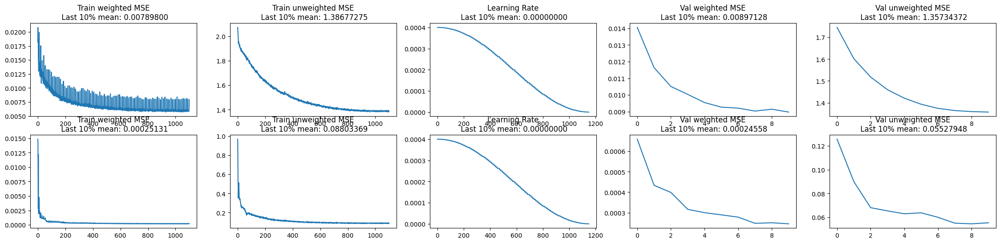

In [7]:
import matplotlib.pyplot as plt
import numpy as np
import pickle

logger_data = {}
# log_dir = f'{checkpoint_path}/logger'
checkpoint_path='checkpoints/pretrain/endecoder_distinct/modal_magnet_0094/enhance_log1p_1/preprocess_1024_0.5_90/weights_typecv-rdbu_3sgm-continous'
# load the logger
for modal in pretrain_args.modal_list:
    print('loading ',modal)
    log_dir = f"{checkpoint_path}/{modal}/logger"
    with open(log_dir + '/logger_train_mse.pkl', 'rb') as f:
        logger_data[f"logger_train_mse_{modal}"] = pickle.load(f)
    with open(log_dir + '/logger_train_weighted_mse.pkl', 'rb') as f:
        logger_data[f"logger_train_weighted_mse_{modal}"] = pickle.load(f)
    with open(log_dir + '/logger_lr.pkl', 'rb') as f:
        logger_data[f"logger_lr_{modal}"] = pickle.load(f)
    with open(log_dir + '/logger_val_mse.pkl', 'rb') as f:
        logger_data[f"logger_val_mse_{modal}"] = pickle.load(f)
    with open(log_dir + '/logger_val_weight_mse.pkl', 'rb') as f:
        logger_data[f"logger_val_weighted_mse_{modal}"] = pickle.load(f)

visualization_num = int(len(logger_data['logger_val_weighted_mse_magnet'])*0.1)

plt.figure(figsize=(28, 6))
for i,modal in enumerate(pretrain_args.modal_list):
    plt.subplot(2,5,1+i*5)
    plt.plot(logger_data[f"logger_train_weighted_mse_{modal}"])
    train_loss_last = np.mean(logger_data[f"logger_train_weighted_mse_{modal}"][-visualization_num:])
    plt.title('Train weighted MSE\n Last 10% mean: {:.8f}'.format(train_loss_last))

    plt.subplot(2,5,2+i*5)
    plt.plot(logger_data[f"logger_train_mse_{modal}"])
    train_loss_mse_last = np.mean(logger_data[f"logger_train_mse_{modal}"][-visualization_num:])
    plt.title('Train unweighted MSE\n Last 10% mean: {:.8f}'.format(train_loss_mse_last))

    plt.subplot(2,5,3+i*5)
    plt.plot(logger_data[f"logger_lr_{modal}"])
    train_lr = np.mean(logger_data[f"logger_lr_{modal}"][-visualization_num:])
    plt.title('Learning Rate\n Last 10% mean: {:.8f}'.format(train_lr))

    plt.subplot(2,5,4+i*5)
    plt.plot(logger_data[f"logger_val_weighted_mse_{modal}"])
    val_loss_last = np.mean(logger_data[f"logger_val_weighted_mse_{modal}"][-visualization_num:])
    plt.title('Val weighted MSE\n Last 10% mean: {:.8f}'.format(val_loss_last))

    plt.subplot(2,5,5+i*5)
    plt.plot(logger_data[f"logger_val_mse_{modal}"])
    val_loss_mse_last = np.mean(logger_data[f"logger_val_mse_{modal}"][-visualization_num:])
    plt.title('Val unweighted MSE\n Last 10% mean: {:.8f}'.format(val_loss_mse_last))

加载val_loader

In [8]:
# os.chdir(os.path.abspath(os.path.join(os.getcwd(),  '..')))

import torch
import random

from Data.utils import transfer_date_to_id
from Data.Solardataloader import enhance_funciton
from Data import Solardataloader_subset
from Model.get_weights import get_weights

start_date = transfer_date_to_id(2020, 6, 30)
end_date = transfer_date_to_id(2024, 6, 30)
print(start_date,end_date)

random.seed(0)
val_loader = Solardataloader_subset.get_loader_by_time(load_imgs=False,time_step=12*60,time_interval=[start_date,end_date] , enhance_list=[1024,0,0], batch_size=5, num_workers=16)
random.seed(0)
with torch.no_grad():
    pretrainModel_mag.eval()
    pretrainModel_0094.eval()
    for i,data in enumerate(val_loader):
        image_mag = data[:,0,:,:,:]
        image_0094 = data[:,1,:,:,:]
        image_mag = enhance_funciton(image_mag, pretrain_args.enhance_list[0], pretrain_args.enhance_list[1])
        image_0094 = enhance_funciton(image_0094, pretrain_args.enhance_list[0], pretrain_args.enhance_list[1])
        weights_mag, _ = get_weights('cv-rdbu', image_mag)
        weights_0094, _ = get_weights('3sgm-continous', image_0094)
        image_mag_recon = pretrainModel_mag(image_mag.to(device))
        image_0094_recon = pretrainModel_0094(image_0094.to(device))
        break

vis_ids = np.arange(5)

image_mag = image_mag[vis_ids].cpu().numpy()
weights_mag = weights_mag[vis_ids].cpu().numpy()
image_mag_recon = image_mag_recon[vis_ids].cpu().numpy()    
image_0094 = image_0094[vis_ids].cpu().numpy()
weights_0094 = weights_0094[vis_ids].cpu().numpy()
image_0094_recon = image_0094_recon[vis_ids].cpu().numpy()    


5346720 7450560
 magnet has 72889 samples
 0094 has 120206 samples
All modal has 1707 samples


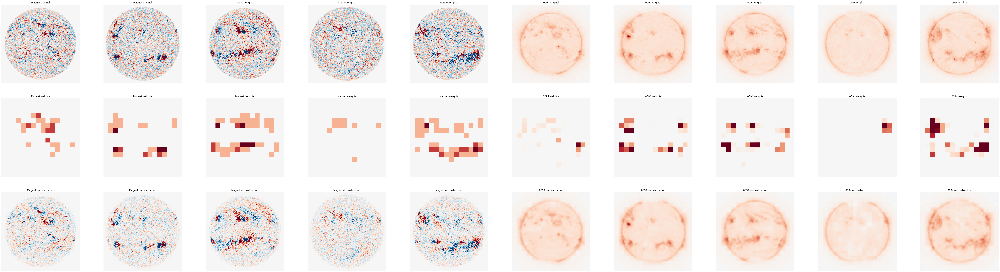

In [9]:
import matplotlib.pyplot as plt

vmin_magnet = np.min(image_mag)
vmax_magnet = np.max(image_mag)
vmax_magnet = np.max([np.abs(vmin_magnet), np.abs(vmax_magnet)])/2
vmin_magnet = -vmax_magnet
vmin_0094 = -np.max(image_0094)
vmax_0094 = np.max(image_0094)

plt.figure(figsize=(90, 24))
for i in range(5):
    plt.subplot(3, 10, i+1)
    plt.imshow(image_mag[i,0,:,:], cmap='RdBu_r',vmin=vmin_magnet, vmax=vmax_magnet)
    plt.axis('off')
    plt.title('Magnet original')

    plt.subplot(3, 10, i+6)
    plt.imshow(image_0094[i,0,:,:], cmap='RdBu_r',vmin=vmin_0094, vmax=vmax_0094)
    plt.axis('off')
    plt.title('0094 original')

    plt.subplot(3, 10, i+11)
    plt.imshow(weights_mag[i,0,:,:], cmap='RdBu_r',vmin=vmin_magnet, vmax=vmax_magnet)
    plt.axis('off')
    plt.title('Magnet weights')

    plt.subplot(3, 10, i+16)
    plt.imshow(weights_0094[i,0,:,:], cmap='RdBu_r',vmin=vmin_magnet, vmax=vmax_magnet)
    plt.axis('off')
    plt.title('0094 weights')

    plt.subplot(3, 10, i+21)
    plt.imshow(image_mag_recon[i,0,:,:], cmap='RdBu_r',vmin=vmin_magnet, vmax=vmax_magnet)
    plt.axis('off')
    plt.title('Magnet reconstruction')

    plt.subplot(3, 10, i+26)
    plt.imshow(image_0094_recon[i,0,:,:], cmap='RdBu_r',vmin=vmin_0094, vmax=vmax_0094)
    plt.axis('off')
    plt.title('0094 reconstruction')

In [ ]:
import torchvision
import PIL

img_path = "img/pan.png"
img_np = PIL.Image.open(img_path)
img_np = img_np.convert('L')

img = torchvision.transforms.ToTensor()(img_np).unsqueeze(0)
img = torchvision.transforms.Resize((1024,1024))(img)

print(img.shape)

with torch.no_grad():
    img_recon_mag = pretrainModel_mag(img.to(device))

img_recon = img_recon_mag.cpu().numpy()
plt.imshow(img_recon[0,0,:,:],cmap='gray')

